## Part I: How are the real estate prices distributed across Austria?
In the following section I will analyze how property prices are distributed accross Austria. The data set includes several categories such as price per m², the municipal, state, district level as well as categories such as broker commission, garden, balcony, elevator, cellar or whether a garage is present. All the rows where no price has been specified are dropped.

In [1]:
from urllib.request import urlopen
import pandas as pd
import numpy as np
import plotly.express as px
import json

df = pd.read_csv('./data/data.csv', encoding='utf-8-sig')
df.rename(columns={'living_area':'area'}, inplace=True)
df['commission'] = df['commission'].apply(lambda x: True if x=='Broker' else False)
df = df.dropna(subset=['price', 'area'])

In [2]:
print(f"The data set has {df.shape[0]} rows")

The data set has 35285 rows


In the following section I will analyze how property prices are distributed accross Austria. The data set includes several categories such as price per m², the municipal, state, district level as well as categories such as broker commission, garden, balcony, elevator, cellar or garage present.

In [3]:
df.head(5)

,municipal,district,state,cc,area,price,price_sqrt,commission,rooms,garden,balcony,type,garage,elevator,cellar
0,6832,Feldkirch,Vorarlberg,80416,84.0,485000.0,5773.8,True,4.0,False,False,condominium,True,True,True
1,6900,Bregenz,Vorarlberg,80207,104.0,899500.0,8649.0,True,4.0,True,False,condominium,True,True,False
2,6900,Bregenz,Vorarlberg,80207,81.0,716900.0,8850.6,True,3.0,True,False,condominium,True,True,False
3,6900,Bregenz,Vorarlberg,80207,92.0,650000.0,7065.2,True,3.5,False,False,condominium,False,False,False
5,6900,Bregenz,Vorarlberg,80207,93.0,699980.0,7526.7,False,4.0,False,False,condominium,False,False,False


In [4]:
df['type'].value_counts()

rented flat           18827
condominium           11503
single-family home     4955
Name: type, dtype: int64

In [5]:
df['rooms'].value_counts().head(10)

2.0    12109
3.0     9800
4.0     4552
1.0     2494
5.0     1769
6.0      498
2.5      376
3.5      328
7.0      257
8.0      175
Name: rooms, dtype: int64

Outlier are removed from the data set. Only rented flats with up to 5 rooms are considered moving forward.

In [6]:
df_rent = df[(df['type'].str.contains('rented flat', na = False)) & (df['rooms'] < 6)].copy()
df_rent['count'] = np.nan # needed for aggregation
print(f"{df_rent.shape[0]} rentable flats remain")

17896 rentable flats remain


The following two functions help us to count the appearance in the aggregated data and to caluclate the ratio of the properties where a real estate agency is selling.

In [7]:
def get_count(raw):
    return int(len(raw))

def calc_comm(raw):
    if len(raw.value_counts()) < 2:
        # With commission -> 100% real estate agency selling
        if raw.value_counts().index.tolist()[0] == True:
            return 1
        # No commission
        else:
            return 0
    else:
        # eq: broker comm./(broker comm. + no broker comm.)
        return round(raw.value_counts().sort_index(ascending=False)[1]/
                     (raw.value_counts().sort_index(ascending=False)[0]+raw.value_counts().sort_index(ascending=False)[1]), 2)


In order to map the data to a geographic area the geo json data needs to be imported:

In [8]:
def get_geo_data(selector):
    # Load Austrian geojson 
    if selector == 'municipal':
        link = 'https://raw.githubusercontent.com/ginseng666/GeoJSON-TopoJSON-Austria/master/2021/simplified-99.5/gemeinden_995_geo.json'

    elif selector == 'district':
            link = 'https://raw.githubusercontent.com/ginseng666/GeoJSON-TopoJSON-Austria/master/2021/simplified-99.9/bezirke_999_geo.json'

    elif selector == 'state':
        link = 'https://raw.githubusercontent.com/ginseng666/GeoJSON-TopoJSON-Austria/master/2021/simplified-99.9/laender_999_geo.json'
   
    with urlopen(link) as response:
        counties = json.load(response)

    return counties

The following fuction generates the geographic heat map based on the provided selector.

In [9]:
def geo_heatmap(df, selector):
    """ selector specifies the geographic resolution """
    feat_key = ''
    locations = ''
    if selector == 'municipal':
        feat_key = "properties.iso"
        locations = "cc"
    elif selector == 'district':
        feat_key = "properties.name"
        locations = "district"
    elif selector == 'state':
        feat_key = "properties.name"
        locations = "state"

    fig = px.choropleth_mapbox(df, geojson=get_geo_data(selector), locations=locations,
                               featureidkey=feat_key, color="price_sqrt",
                               color_continuous_scale="Viridis",
                               range_color=(df['price_sqrt'].quantile(0.25), df['price_sqrt'].quantile(0.75)),
                               mapbox_style="carto-positron",
                               zoom=5, center = {"lat": 47.809490, "lon": 13.055010},
                               opacity=0.25,
                              )
    fig.update_layout(coloraxis_colorbar_title='€/m²')
    fig.show()

The following heat map shows the real estate prices on a state level. The median prices per m² of rental property are the highest in Tyrol followed by Vorarlberg, Vienna and Salzburg. Vorarlberg however, has only a total of 94 advertisements and might be overrepresented.

In [10]:
df2 = df_rent.groupby(['state'], as_index=False).agg({'price':'mean', 'price_sqrt':'median', 'state':'first', 'commission':calc_comm, 'count':get_count})
df2.sort_values("price_sqrt", ascending=False)

,price,price_sqrt,state,commission,count
6,1131.487434,16.8,Tirol,0.91,265.0
7,1029.685161,16.4,Vorarlberg,0.98,93.0
8,1027.271899,16.4,Wien,0.91,8532.0
4,1036.028018,15.0,Salzburg,0.95,545.0
1,800.227224,11.3,Kärnten,0.92,407.0
3,772.037258,11.2,Oberösterreich,0.91,2429.0
2,763.199242,11.0,Niederösterreich,0.87,3338.0
5,655.589082,10.9,Steiermark,0.94,1950.0
0,730.609288,9.6,Burgenland,0.96,337.0


The following heatmap shows the real estate prices on a district level.

In [11]:
geo_heatmap(df2, 'state')

In [12]:
df2 = df_rent.groupby(['district'], as_index=False).agg({'price': 'mean', 'price_sqrt': 'mean', 'district': 'first', 'state': 'first', 'commission':calc_comm, 'count':get_count})
df2.sort_values("price_sqrt", ascending=False).head(15)

,price,price_sqrt,district,state,commission,count
32,1718.724286,22.606122,Kitzbühel,Tirol,0.90,49.0
85,2460.082491,22.216484,"Wien 1.,Innere Stadt",Wien,0.94,273.0
29,1162.127736,20.807547,Innsbruck-Stadt,Tirol,0.83,53.0
86,1116.370072,19.257108,"Wien 2.,Leopoldstadt",Wien,0.83,415.0
2,1221.000000,18.800000,Bludenz,Vorarlberg,1.00,1.0
93,1364.186095,17.962130,"Wien 9.,Alsergrund",Wien,0.95,169.0
91,1193.272164,17.679851,"Wien 7.,Neubau",Wien,0.94,134.0
87,1058.908051,17.596751,"Wien 3.,Landstraße",Wien,0.94,554.0
103,841.718371,17.564160,"Wien 20.,Brigittenau",Wien,0.77,399.0
90,1241.215405,17.345270,"Wien 6.,Mariahilf",Wien,0.97,148.0


For some of the districts it is difficult to draw a conclusion since the sample size is very low. 
One example would be Bludenz with just one rental property.

In [13]:
geo_heatmap(df2, 'district')

In [14]:
df2 = df_rent.groupby(['cc'], as_index=False).agg({'price': 'mean', 'price_sqrt': 'mean', 'municipal': 'first', 'district': 'first', 'state': 'first', 'commission':calc_comm, 'count':get_count})
df2.sort_values("price_sqrt", ascending=False).head(15)

,cc,price,price_sqrt,municipal,district,state,commission,count
80,20424,4215.035000,50.150000,9210,Klagenfurt Land,Kärnten,1.00,2.0
737,50401,2231.666667,37.366667,5541,Sankt Johann im Pongau,Salzburg,0.67,3.0
984,70411,2576.446842,30.531579,6370,Kitzbühel,Tirol,1.00,19.0
958,70308,600.000000,27.300000,6403,Innsbruck-Land,Tirol,1.00,1.0
982,70409,1167.500000,25.650000,6365,Kitzbühel,Tirol,1.00,2.0
985,70413,2499.000000,24.950000,6372,Kitzbühel,Tirol,0.50,2.0
1034,80413,490.000000,24.500000,6812,Feldkirch,Vorarlberg,1.00,2.0
950,70217,1701.975000,24.100000,6481,Imst,Tirol,1.00,2.0
1035,90101,2460.082491,22.216484,1010,"Wien 1.,Innere Stadt",Wien,0.94,273.0
686,41749,1738.890000,21.500000,4852,Vöcklabruck,Oberösterreich,1.00,1.0


In [15]:
geo_heatmap(df2, 'municipal')

In [16]:
df2[(df2['state']=='Vorarlberg') & (df2['district']=='Bludenz')]['cc']


1031    80405
Name: cc, dtype: int64

Breaking down the geographical structure to the municipal level confirms that even the picture painted on district level
should be perceived with great care. For example, the district "Bludenz" accounts for a large area and has just one data entry (cc is 80405). The situation is similar for the rest of Tyrol which is very underrepresented sample wise compared to the rest of Austria.

## Part II: What attributes contributing to a higher condo price the most?

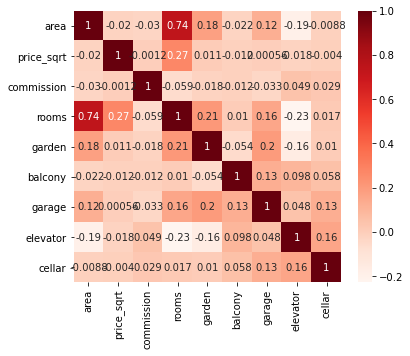

In [17]:
import seaborn as sns
import matplotlib.pyplot as plt

df_f = df.drop(['cc', 'municipal', 'price'], axis=1)

plt.figure(figsize=(6,5))
cor = df_f.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

In [18]:
cor_target = abs(cor['price_sqrt'])#Selecting correlated features
cor_target[cor_target>0.1]

price_sqrt    1.000000
rooms         0.274354
Name: price_sqrt, dtype: float64

In [19]:
cor_target = abs(cor['rooms'])
cor_target[cor_target>0.1]

area          0.740083
price_sqrt    0.274354
rooms         1.000000
garden        0.211710
garage        0.156068
elevator      0.228487
Name: rooms, dtype: float64

In [20]:
cor_target = abs(cor['cellar'])
cor_target[cor_target>0.1]

garage      0.127840
elevator    0.161841
cellar      1.000000
Name: cellar, dtype: float64

At this point it is difficult to draw conclusions regarding certain factors contributing to the rental price of a flat. From the correlation matrix it is obvious that the number of rooms is highly correlated to the living area. Flats with a cellar are more likely to have an elevator and a garage or parking lot. However these are still very weak correlation and needs to be further investigated.

## Part III: What are the chances of getting a condo without a real estate agency?
From the 35,000 properties in the data set only 9.5% are without a real estate agency.

In [21]:
df.commission.value_counts()

True     28775
False     6510
Name: commission, dtype: int64

In [22]:
print(f"{100 *round(df.commission.value_counts()[1]/df.shape[0],3)}% of the flats can only be rented from a real eastate agency.")

81.6% of the flats can only be rented from a real eastate agency.
